In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import skimage.segmentation as seg
from skimage.color import label2rgb
from skimage.metrics import adapted_rand_error
import os

# Folder containing images
image_folder = "C:/Users/USER/Desktop/test/images/"  # Change to your actual folder path
output_folder = "C:/Users/USER/Desktop/test/masks"
os.makedirs(output_folder, exist_ok=True)


In [3]:
# List all image files in the folder
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Apply Gaussian filter and save results
for image_file in image_files:
    # Read the image
    image_path = os.path.join(image_folder, image_file)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for correct visualization
    
    # Apply Gaussian Blur
    gaussian_filtered = cv2.GaussianBlur(image, (5, 5), 0)
    

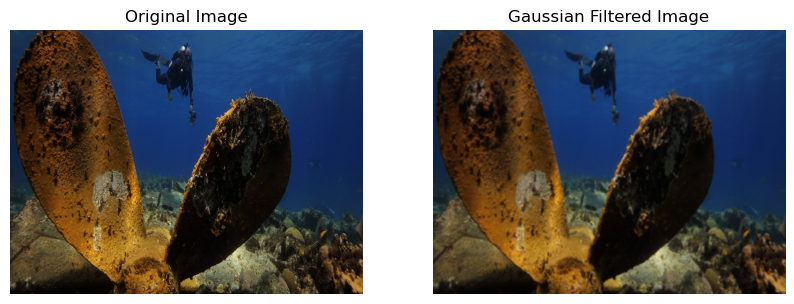

Gaussian filtering applied and saved successfully.


In [4]:
    # Save filtered image
    output_path = os.path.join(output_folder, image_file)
    cv2.imwrite(output_path, cv2.cvtColor(gaussian_filtered, cv2.COLOR_RGB2BGR))
    
    # Show before and after comparison
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.imshow(gaussian_filtered)
    plt.title("Gaussian Filtered Image")
    plt.axis("off")
    
    plt.show()
    
print("Gaussian filtering applied and saved successfully.")


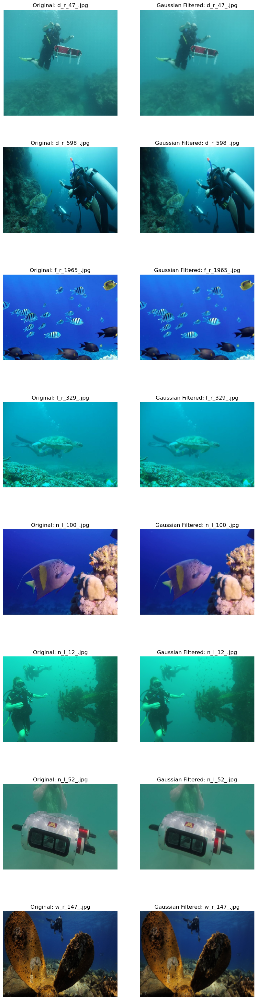

Gaussian filtering applied and displayed successfully.


In [6]:
# Apply Gaussian filter and print all images
plt.figure(figsize=(10, len(image_files) * 5))
for i, image_file in enumerate(image_files):
    # Read the image
    image_path = os.path.join(image_folder, image_file)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for correct visualization
    
    # Apply Gaussian Blur
    gaussian_filtered = cv2.GaussianBlur(image, (5, 5), 0)
    
    # Save filtered image
    output_path = os.path.join(output_folder, image_file)
    cv2.imwrite(output_path, cv2.cvtColor(gaussian_filtered, cv2.COLOR_RGB2BGR))
    
    # Show before and after comparison
    plt.subplot(len(image_files), 2, 2 * i + 1)
    plt.imshow(image)
    plt.title(f"Original: {image_file}")
    plt.axis("off")
    
    plt.subplot(len(image_files), 2, 2 * i + 2)
    plt.imshow(gaussian_filtered)
    plt.title(f"Gaussian Filtered: {image_file}")
    plt.axis("off")
    
plt.show()
print("Gaussian filtering applied and displayed successfully.")


# NON LINEAR FILTERING 

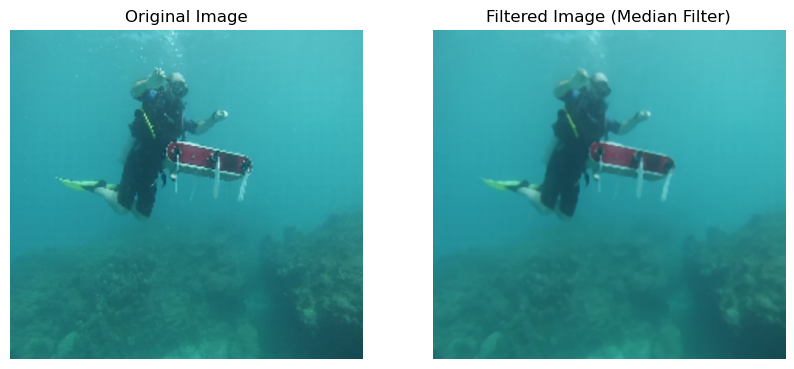

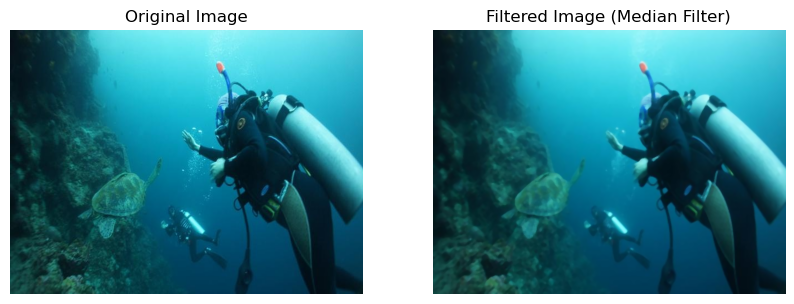

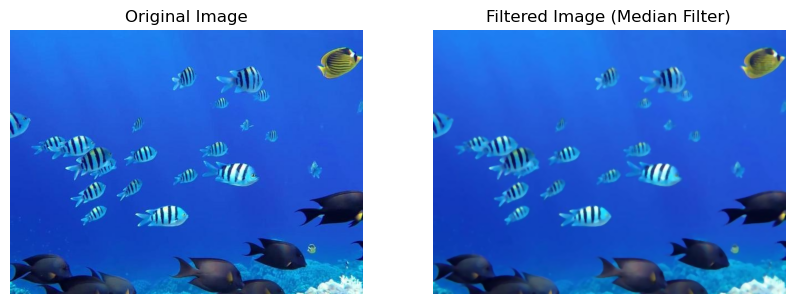

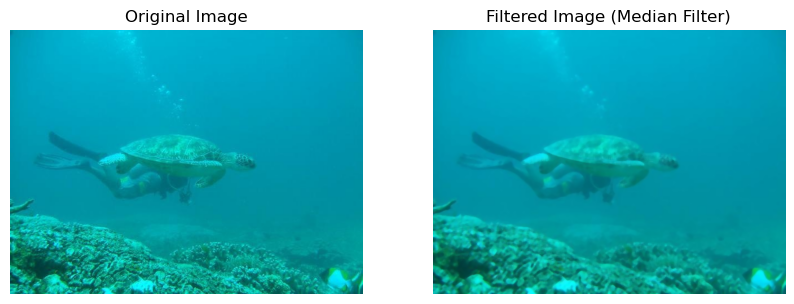

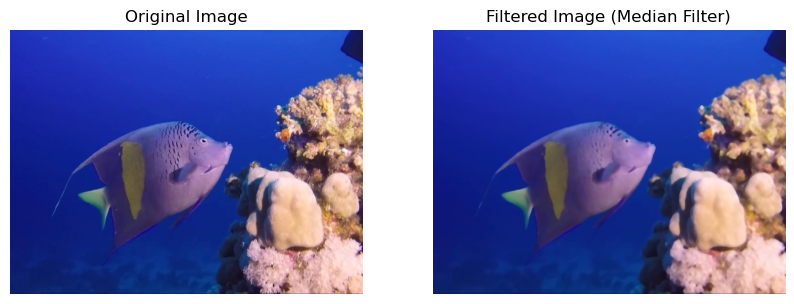

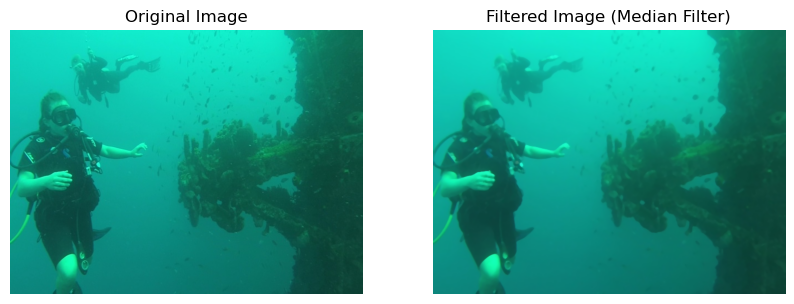

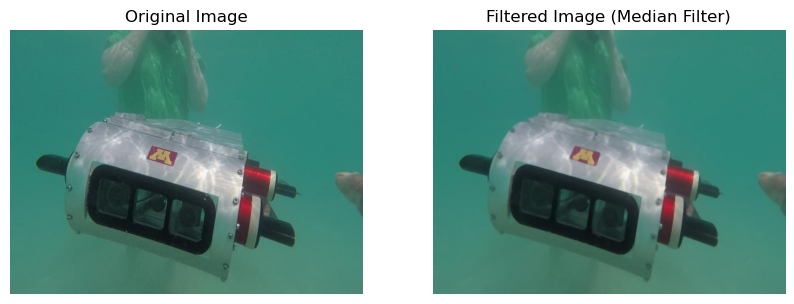

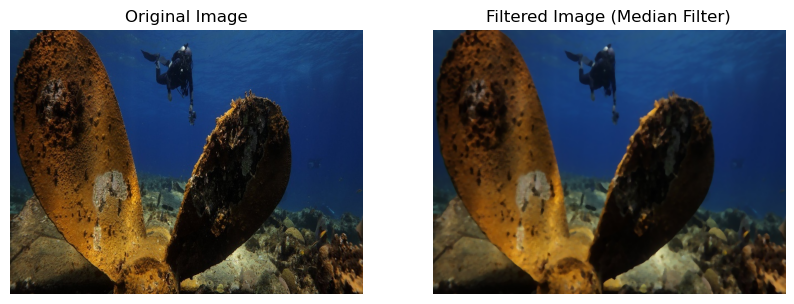

In [7]:
# Apply Median Filtering (Non-Linear Filter)
def apply_median_filter(image_path, kernel_size=5):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for proper display
    filtered_image = cv2.medianBlur(image, kernel_size)
    return image, filtered_image

# Process and display images
for image_file in image_files:
    image_path = os.path.join(image_folder, image_file)
    original, filtered = apply_median_filter(image_path)
    
    # Plot original vs. filtered image
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(original)
    plt.title("Original Image")
    plt.axis("off")
    
    plt.subplot(1,2,2)
    plt.imshow(filtered)
    plt.title("Filtered Image (Median Filter)")
    plt.axis("off")
    
    plt.show()


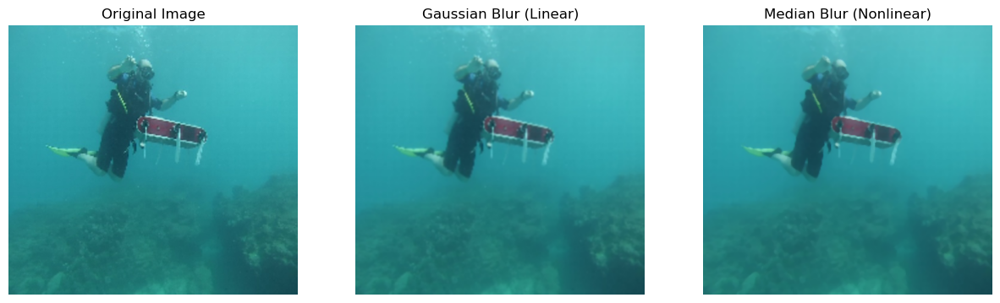

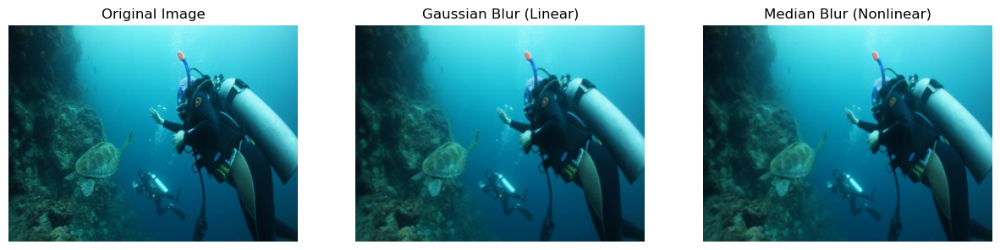

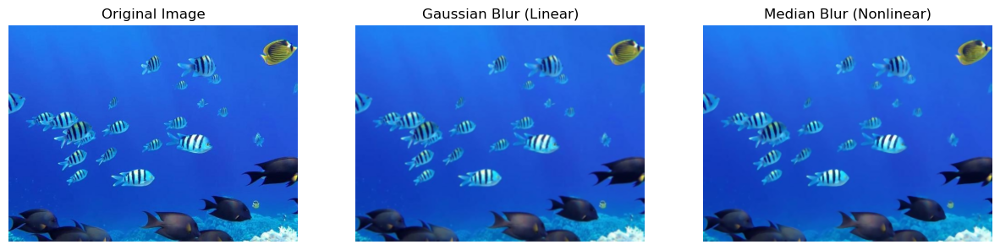

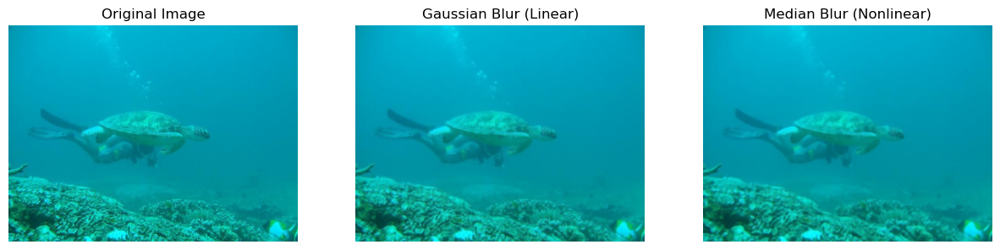

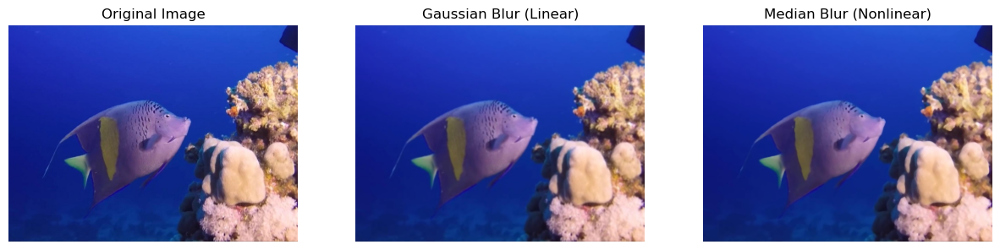

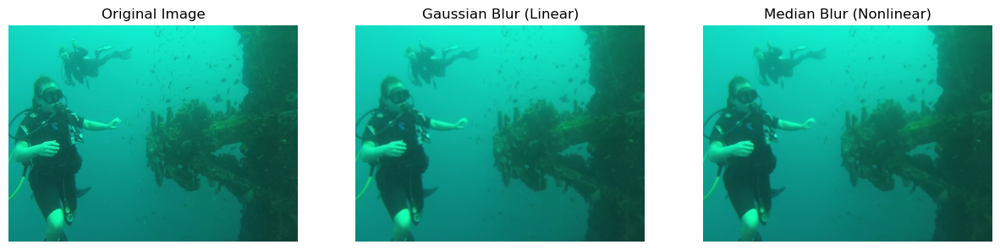

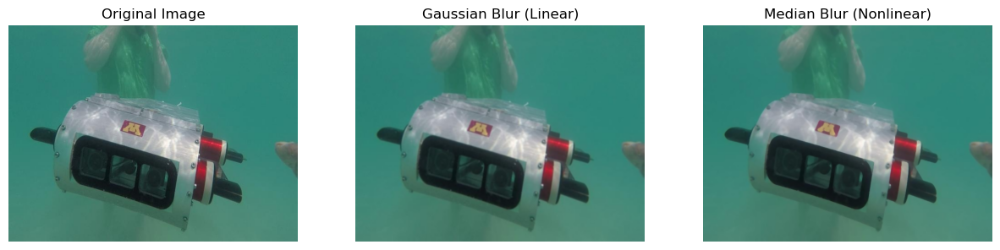

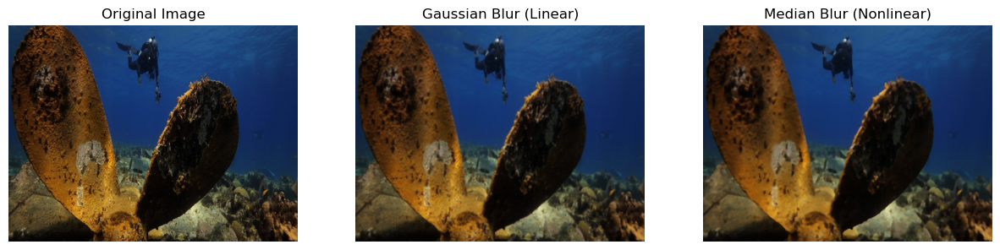

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Folder containing images
image_folder = "C:/Users/USER/Desktop/test/images/"  # Change to your actual folder path
output_folder = "C:/Users/USER/Desktop/test/masks/"
os.makedirs(output_folder, exist_ok=True)

# Get list of image files
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Apply noise reduction filters and visualize results
for image_file in image_files:
    image_path = os.path.join(image_folder, image_file)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for proper matplotlib visualization
    
    # Apply Gaussian Blur (Linear Filtering)
    gaussian_blur = cv2.GaussianBlur(image, (5, 5), 0)
    
    # Apply Median Filter (Nonlinear Filtering)
    median_blur = cv2.medianBlur(image, 5)
    
    # Show results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")
    
    axes[1].imshow(gaussian_blur)
    axes[1].set_title("Gaussian Blur (Linear)")
    axes[1].axis("off")
    
    axes[2].imshow(median_blur)
    axes[2].set_title("Median Blur (Nonlinear)")
    axes[2].axis("off")
    
    plt.show()
    
    # Save filtered images (optional)
    cv2.imwrite(os.path.join(output_folder, "gaussian_" + image_file), cv2.cvtColor(gaussian_blur, cv2.COLOR_RGB2BGR))
    cv2.imwrite(os.path.join(output_folder, "median_" + image_file), cv2.cvtColor(median_blur, cv2.COLOR_RGB2BGR))


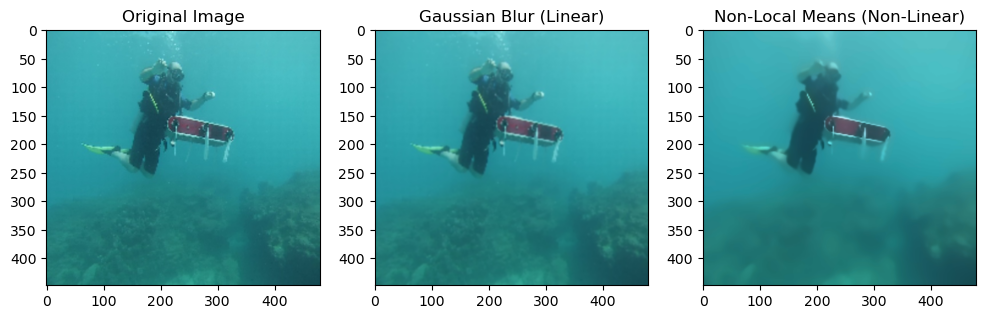

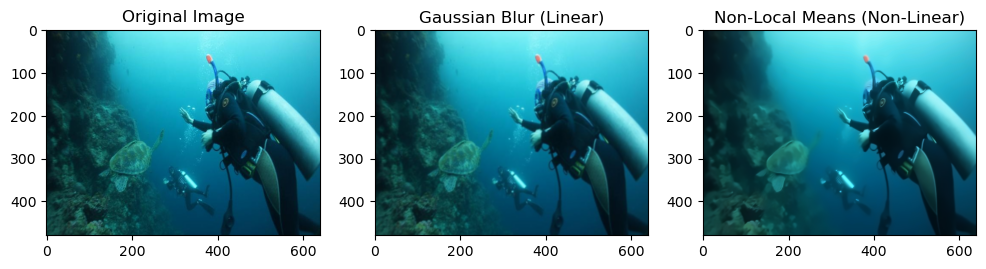

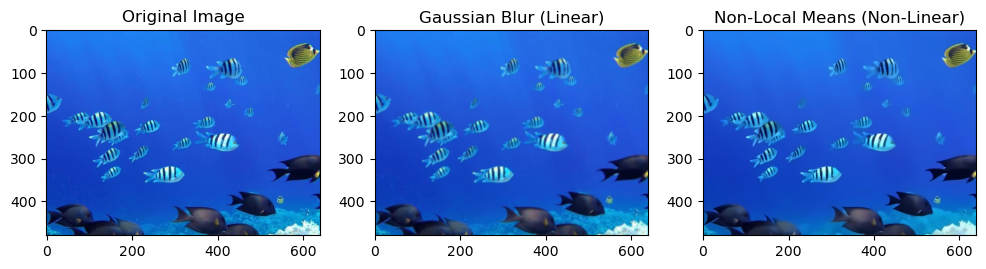

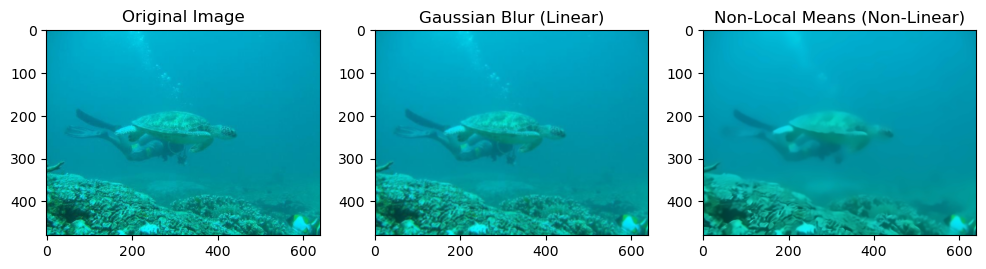

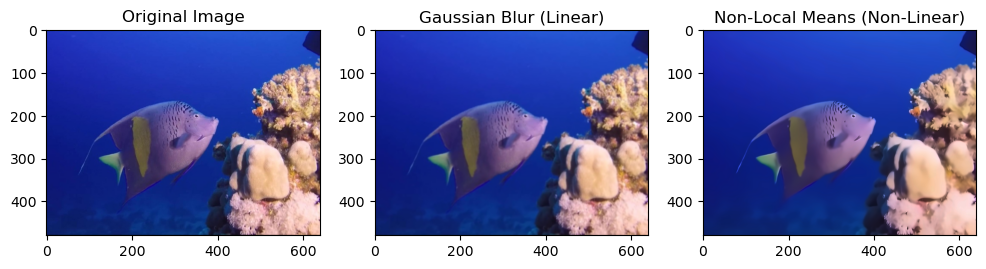

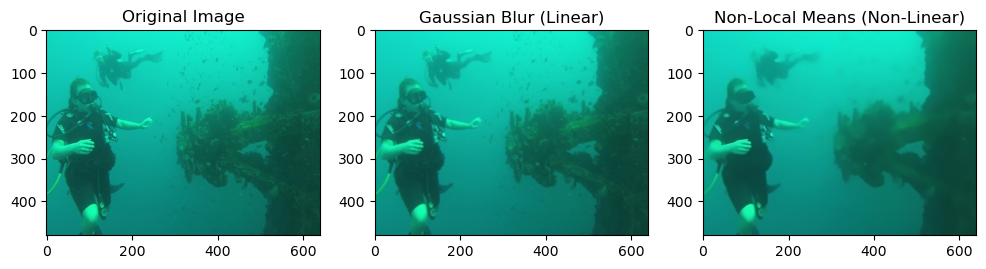

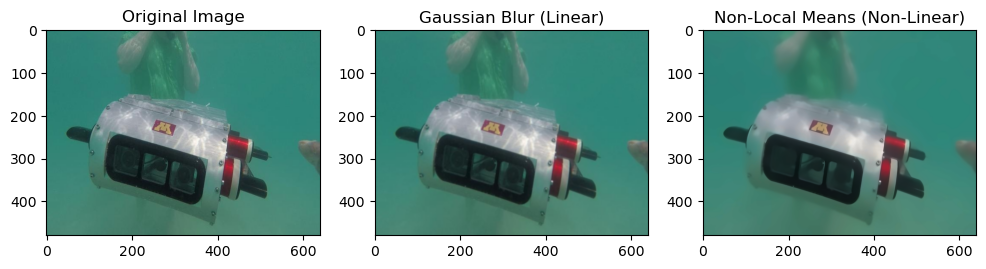

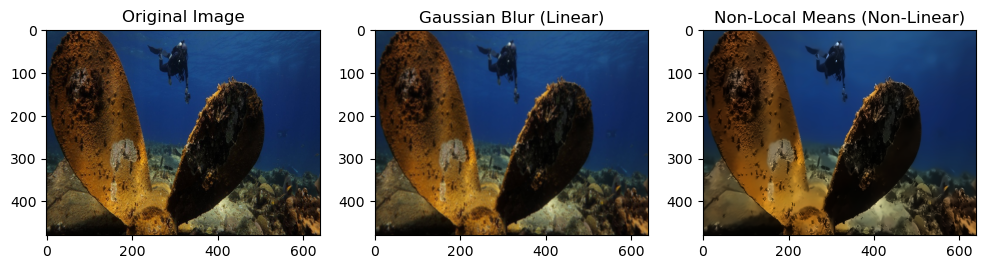

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Folder paths
image_folder = "C:/Users/USER/Desktop/test/images/"
output_folder = "C:/Users/USER/Desktop/test/filtered/"
os.makedirs(output_folder, exist_ok=True)

# Function for applying Gaussian Blur (Linear Filtering)
def apply_gaussian_blur(image, kernel_size=(5, 5), sigma=1):
    return cv2.GaussianBlur(image, kernel_size, sigma)

# Function for applying Non-Local Means Denoising (Non-Linear Filtering)
def apply_nlm_filtering(image, h=10, templateWindowSize=7, searchWindowSize=21):
    return cv2.fastNlMeansDenoisingColored(image, None, h, h, templateWindowSize, searchWindowSize)

# Process images
for filename in os.listdir(image_folder):
    img_path = os.path.join(image_folder, filename)
    image = cv2.imread(img_path)

    if image is None:
        print(f"Skipping {filename}: Unable to read file.")
        continue

    # Apply filters
    gaussian_filtered = apply_gaussian_blur(image)
    nlm_filtered = apply_nlm_filtering(image)

    # Save results
    cv2.imwrite(os.path.join(output_folder, f"gaussian_{filename}"), gaussian_filtered)
    cv2.imwrite(os.path.join(output_folder, f"nlm_{filename}"), nlm_filtered)

    # Display results
    fig, ax = plt.subplots(1, 3, figsize=(12, 4))
    ax[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax[0].set_title("Original Image")

    ax[1].imshow(cv2.cvtColor(gaussian_filtered, cv2.COLOR_BGR2RGB))
    ax[1].set_title("Gaussian Blur (Linear)")

    ax[2].imshow(cv2.cvtColor(nlm_filtered, cv2.COLOR_BGR2RGB))
    ax[2].set_title("Non-Local Means (Non-Linear)")

    plt.show()
